Условия

Если задача не отображается, то вы либо не авторизованы, либо не нажали кнопку кнопку «принять участие» на этой странице.

В данном соревновании вам предстоит решить задачу бинарной классификации. Вам будут даны тренировочная (10000 примеров) и тестовая (2000) выборки. Количество признаков — 30.

Для успешного решения данного задания вам предстоит правильно настроить валидацию, провести отбор признаков и подобрать параметры для итоговой модели.

В результате, необходимо предсказать вероятности положительного класса для данных из тестовой выборки.

Качество решения оценивается по стандартной метрике ROC-AUC. Код:

На экзамене за данную задачу вы можете получить до 100 баллов. Расчёт баллов производится по формуле:

где y — это ваш результат по метрике ROC-AUC. Количество баллов является округленным целым числом.

Желаем удачи!

In [26]:
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score
from sklearn.svm import SVC

In [29]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_validate

from sklearn.model_selection import train_test_split, StratifiedShuffleSplit

import seaborn

In [5]:
!ls

correlation_matrix.png	output.png			  svc.csv
forest2.csv		plot_classifier_comparison.ipynb  test.csv
knn.csv			sample-submission.csv		  train.csv
nn.csv			Solution.ipynb			  train-target.csv


# data load

In [6]:
data = pd.read_csv("train.csv", header=None)
y = pd.read_csv("train-target.csv", header=None)
data["target"] = y[0]

# balance

In [7]:
y[0].value_counts()

1    5051
0    4949
Name: 0, dtype: int64

# NA

In [8]:
data.isnull().sum()

0         0
1         0
2         0
3         0
4         0
5         0
6         0
7         0
8         0
9         0
10        0
11        0
12        0
13        0
14        0
15        0
16        0
17        0
18        0
19        0
20        0
21        0
22        0
23        0
24        0
25        0
26        0
27        0
28        0
29        0
target    0
dtype: int64

# Features plot

## train dat

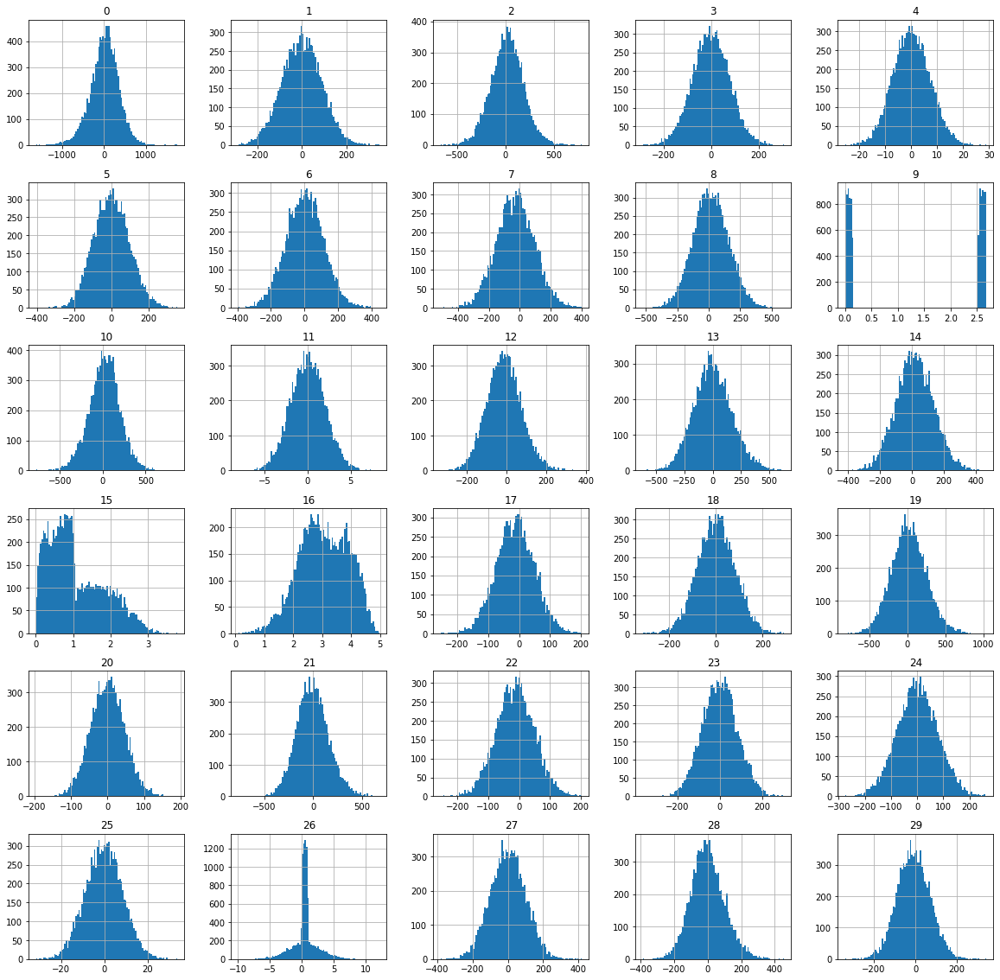

In [9]:
# Установите размер изображения (20, 20) для первой группы признаков, для обеих групп bins=100
data[data.columns[:-1]].hist(figsize = (20,20),bins = 100)
plt.show()

In [10]:
test = pd.read_csv("test.csv", header=None)
test.head()

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,394.650101,-102.778703,-48.854416,17.463193,4.744214,-90.504260,135.111157,-27.691507,192.961067,1.755201,...,-56.947165,140.952506,1.885744,11.483086,-131.665132,12.876561,0.156747,-185.849095,-29.314711,-84.254441
1,62.200701,-139.323500,235.644493,10.860594,1.921110,39.088440,-186.024836,-53.158605,-122.290561,1.426944,...,-45.854744,-148.360929,2.614495,-24.895114,-40.050598,7.376349,1.962719,-123.776910,65.756136,-10.378203
2,232.736729,5.502143,204.738165,45.738959,1.338264,33.604743,92.235943,-115.127927,-95.263085,2.048801,...,-15.638165,-234.606490,0.409558,286.011182,48.109151,-9.277772,1.838195,19.461847,126.144518,-121.300353
3,340.045437,-129.924115,62.694027,61.899097,-1.294288,-58.616589,-55.080664,10.115134,9.051856,2.732693,...,13.407883,-56.332212,2.801811,70.875892,26.673509,2.389621,2.188665,109.700845,109.378365,-58.425305
4,-60.576957,71.958472,489.203093,121.380719,-3.620431,44.666983,-161.487192,137.920737,540.680255,1.172919,...,-51.559846,-6.645415,1.889414,-21.814728,-91.701674,-9.206418,1.211916,-11.602746,-8.162451,-87.902970


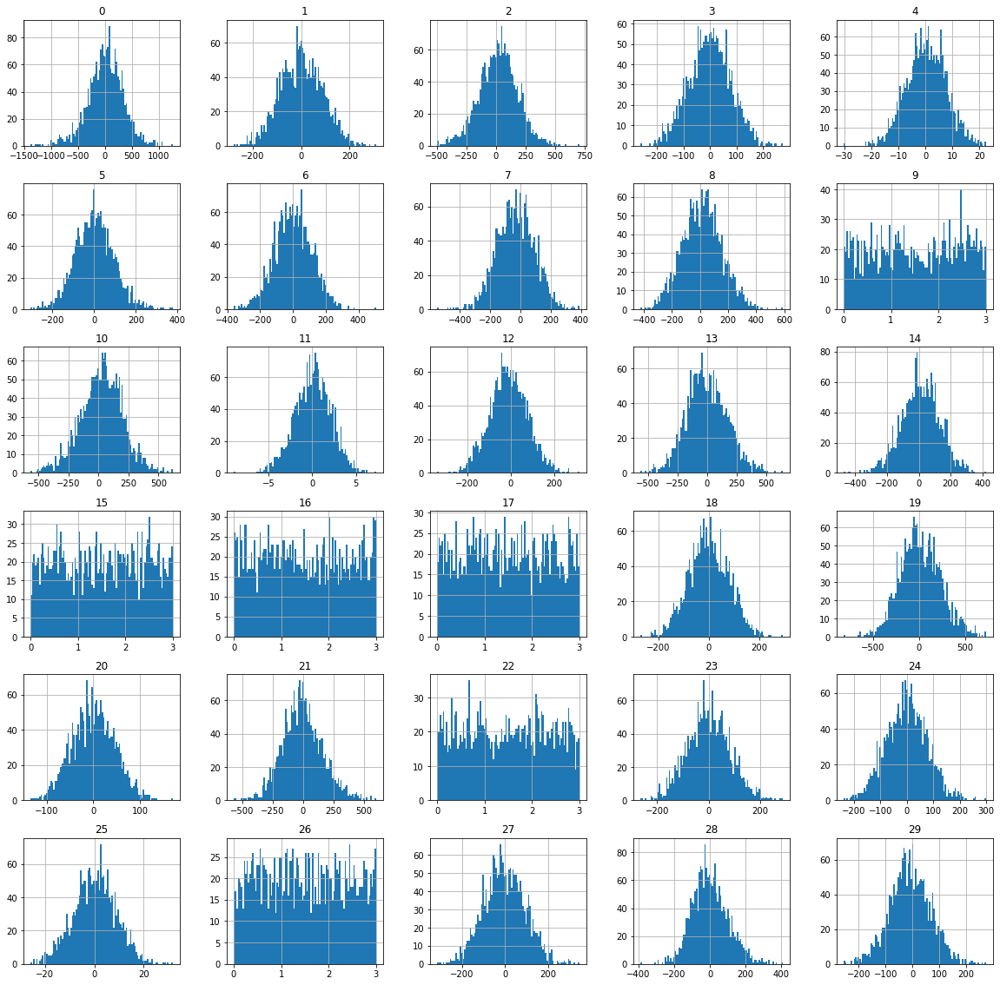

In [11]:
# Установите размер изображения (20, 20) для первой группы признаков, для обеих групп bins=100
test.hist(figsize = (20,20),bins = 100)
plt.show()

In [12]:
garbage = [9, 15, 16, 17, 22, 26]
selected = set(data.columns) - set(garbage)
features = list(selected - set(['target']))

## selected columns

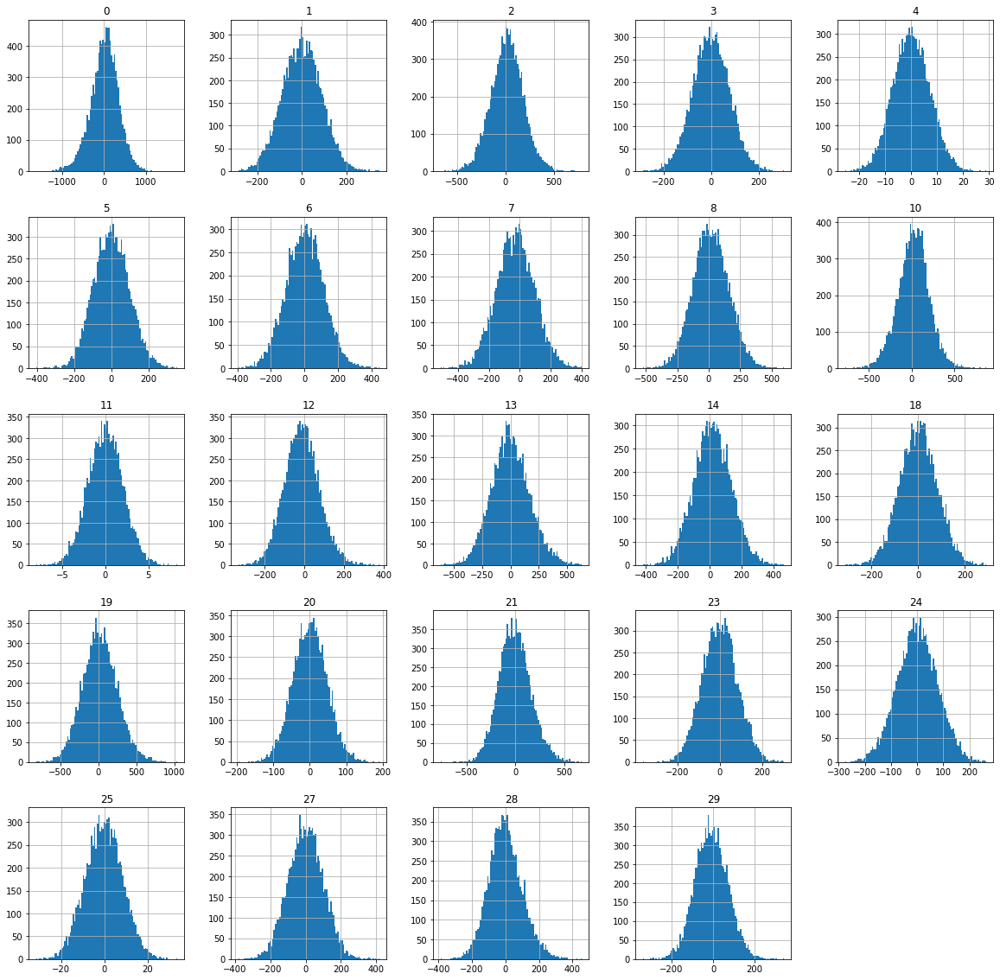

In [13]:
data[features].hist(figsize = (20,20),bins = 100)
plt.show()

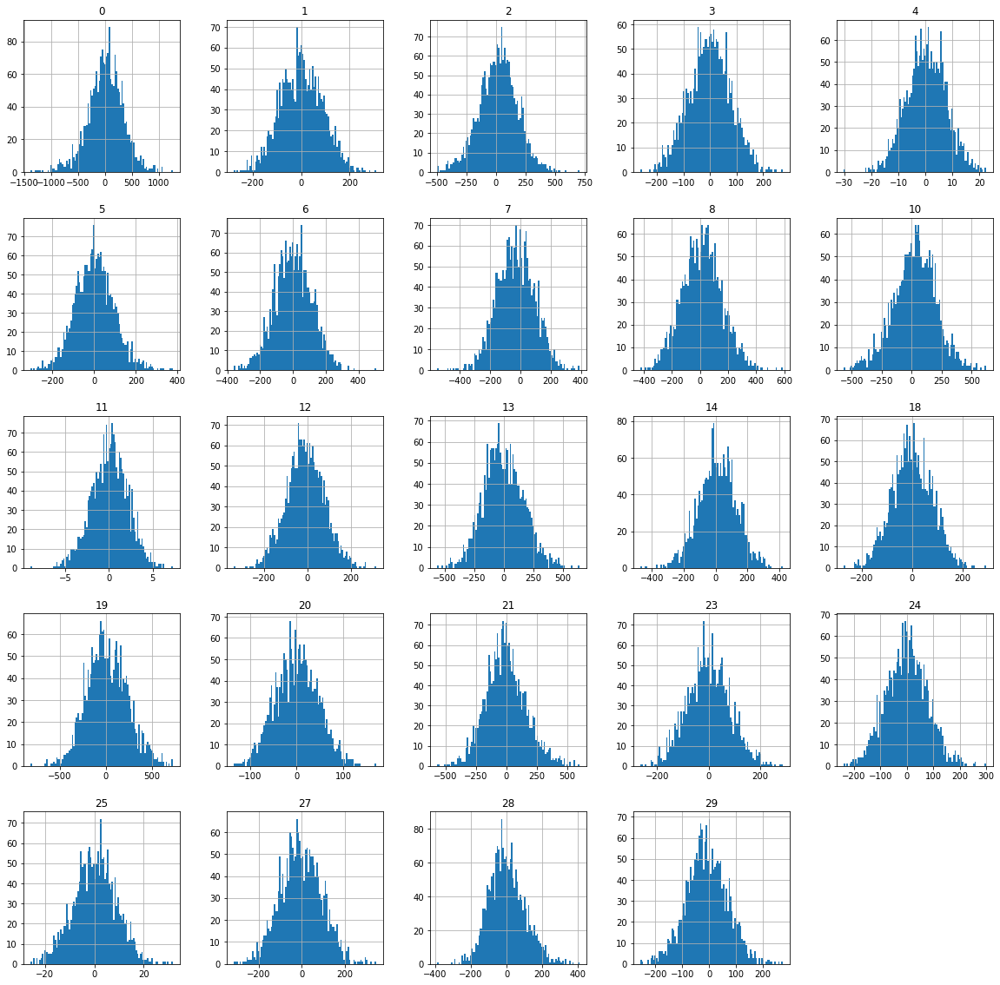

In [14]:
# Установите размер изображения (20, 20) для первой группы признаков, для обеих групп bins=100
test[features].hist(figsize = (20,20),bins = 100)
plt.show()

del 17 and 22 columns as + correlation with 7th column

# Feature importance

In [15]:
from sklearn.ensemble import ExtraTreesClassifier

# Build a forest and compute the impurity-based feature importances
forest = ExtraTreesClassifier(n_estimators=600,
                              random_state=13, n_jobs=-1)

Feature ranking:
1. feature 10 (0.055118)
2. feature 2 (0.054772)
3. feature 8 (0.054136)
4. feature 14 (0.052945)
5. feature 13 (0.051086)
6. feature 29 (0.048520)
7. feature 7 (0.047856)
8. feature 12 (0.046634)
9. feature 5 (0.044575)
10. feature 0 (0.043655)
11. feature 28 (0.043609)
12. feature 21 (0.043421)
13. feature 6 (0.042475)
14. feature 19 (0.040935)
15. feature 24 (0.033552)
16. feature 1 (0.033125)
17. feature 11 (0.033104)
18. feature 18 (0.033071)
19. feature 4 (0.033004)
20. feature 27 (0.032973)
21. feature 3 (0.032972)
22. feature 25 (0.032887)
23. feature 23 (0.032843)
24. feature 20 (0.032733)


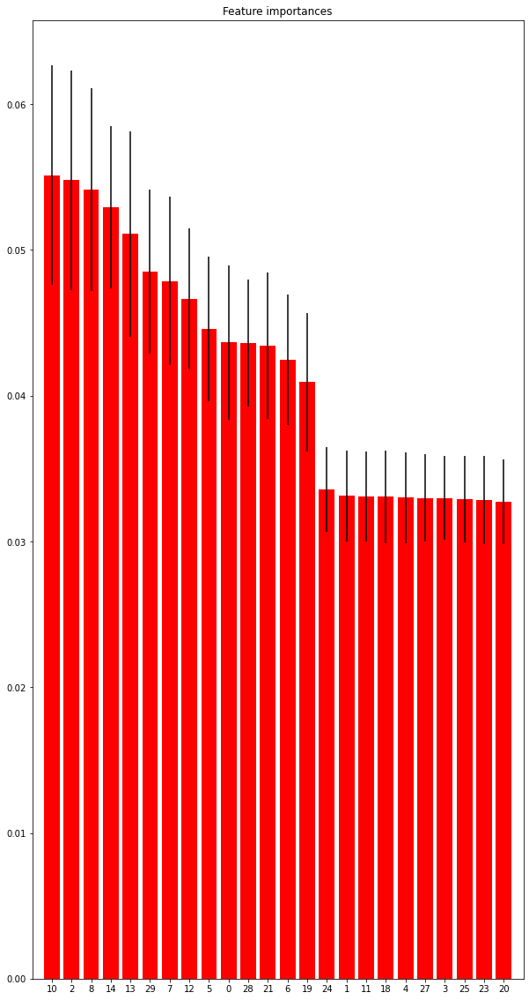

In [16]:
X = data[features]
forest.fit(X, data["target"])
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(X.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, features[indices[f]], importances[indices[f]]))

# Plot the impurity-based feature importances of the forest
plt.figure(figsize=(10, 20))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
        color="r", yerr=std[indices], align="center")
plt.xticks(range(X.shape[1]), np.array(features)[indices])
plt.xlim([-1, X.shape[1]])
plt.show()

In [17]:
np.sum(importances[indices])
len(indices)

24

In [18]:
important_features = np.array(features)[indices][:14].tolist()
important_features

[10, 2, 8, 14, 13, 29, 7, 12, 5, 0, 28, 21, 6, 19]

# Classification

## Load data again

In [21]:
data = pd.read_csv("train.csv", header=None)
data["target"] = pd.read_csv("train-target.csv", header=None)
work_data = data[important_features+['target']]
y = data['target']
work_data

,10,2,8,14,13,29,7,12,5,0,28,21,6,19,target
0,271.292251,119.035181,-41.571463,25.157748,12.998666,33.838225,-166.521871,44.529272,52.225051,-220.530530,-37.942655,46.543585,-23.230903,-36.818566,1
1,-97.233793,-117.828269,27.749744,-128.433975,2.867261,-4.826111,58.898976,-104.382283,-42.087807,-8.536541,-52.255449,121.304258,-45.538664,103.060202,1
2,194.054804,-105.511797,-46.240211,-126.200888,86.972373,-93.990332,100.838385,-145.510845,-104.302244,126.229973,-107.835928,88.905713,5.815395,-150.020696,0
3,-215.802195,-299.969407,-108.847522,138.824836,-99.997710,-16.877368,-149.741411,-128.050861,-115.901854,369.571563,121.674228,-166.476192,159.134323,310.894782,0
4,-115.997344,-73.363391,-50.054608,-124.206264,36.416791,-15.799596,-49.237377,97.666751,-54.892519,-99.563708,3.492953,209.163125,56.430532,121.929801,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-82.546051,-93.520627,100.601251,-60.626261,-184.511836,-132.648400,67.060275,-23.068911,-58.349354,-91.804097,-83.305311,418.328185,233.433179,236.665627,1
9996,107.862166,45.472736,8.091318,67.611206,251.502874,5.783203,77.938740,-140.798090,39.012270,-232.083597,-66.463502,-29.944248,-78.622327,-158.858311,0
9997,-202.054583,-221.763797,204.767129,102.854903,131.994556,86.333468,-136.962854,100.354506,-121.460703,-182.455289,-207.574071,102.332041,-33.409815,541.086356,0
9998,-394.669287,-176.197832,-85.361397,27.684414,-106.070414,78.433097,81.571360,18.162228,59.329437,-268.344148,2.626694,44.399330,67.922422,169.111260,1


# SVC

In [154]:


X = StandardScaler().fit_transform(work_data[important_features])
X_train, X_validation, y_train, y_validation = train_test_split(
    X, work_data["target"], train_size=0.66, stratify=work_data["target"], shuffle=True, random_state=1)

In [193]:


cls = SVC(kernel='rbf', degree=4, probability=True,
          class_weight='balanced', gamma='auto', C=1)

scores = cross_validate(cls, X_train, y_train, cv = StratifiedShuffleSplit(4), scoring= "roc_auc",)["test_score"]
print(f"{np.mean(scores):.5f}+-{np.std(scores):.5f}")

0.84481+-0.00802


In [195]:
cls.fit(X_train, y_train)
print(roc_auc_score(y_validation, cls.predict_proba(X_validation)[:,1]))

0.837994872151575


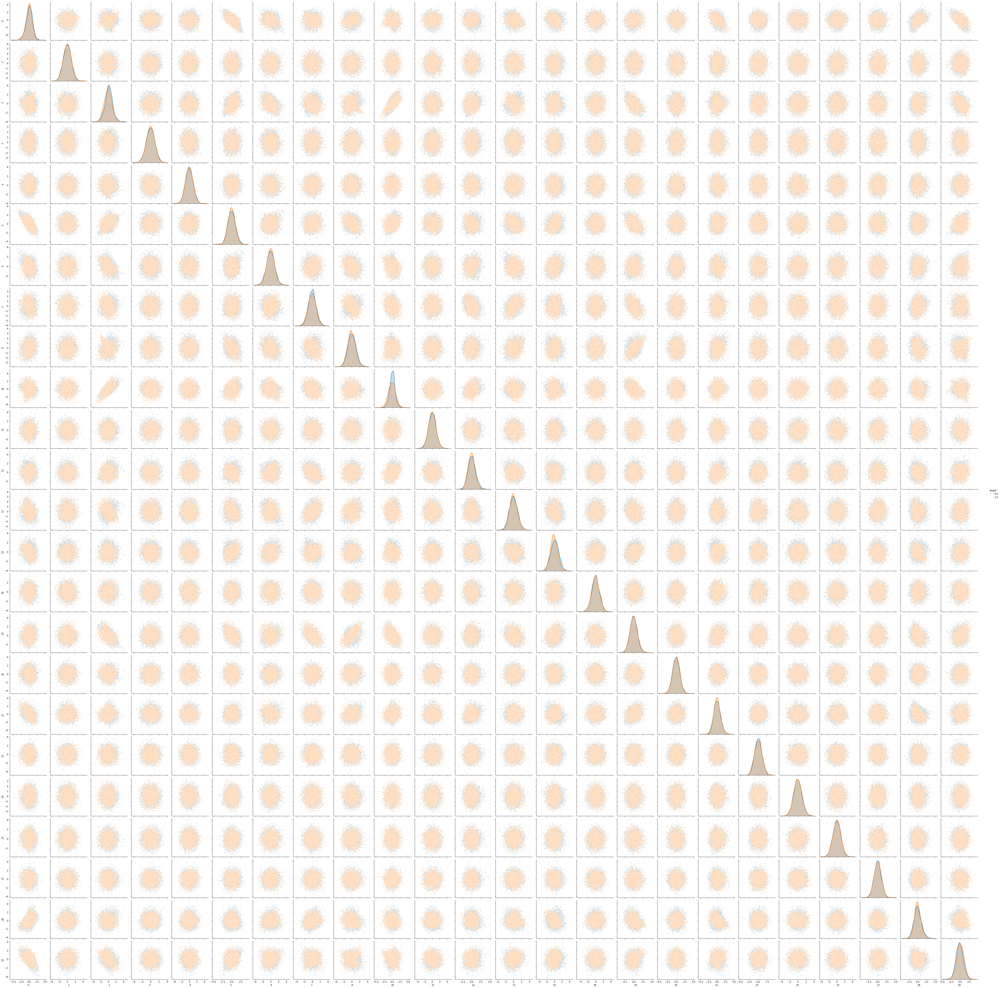

In [113]:
sns_plot = seaborn.pairplot(
    pd.DataFrame(np.c_[X_train,y_train], columns = features + ['target']), hue="target", diag_kind="kde", plot_kws={"s": 5})
sns_plot.savefig("output.png")

In [144]:
train = pd.DataFrame(X_train , columns = important_features)

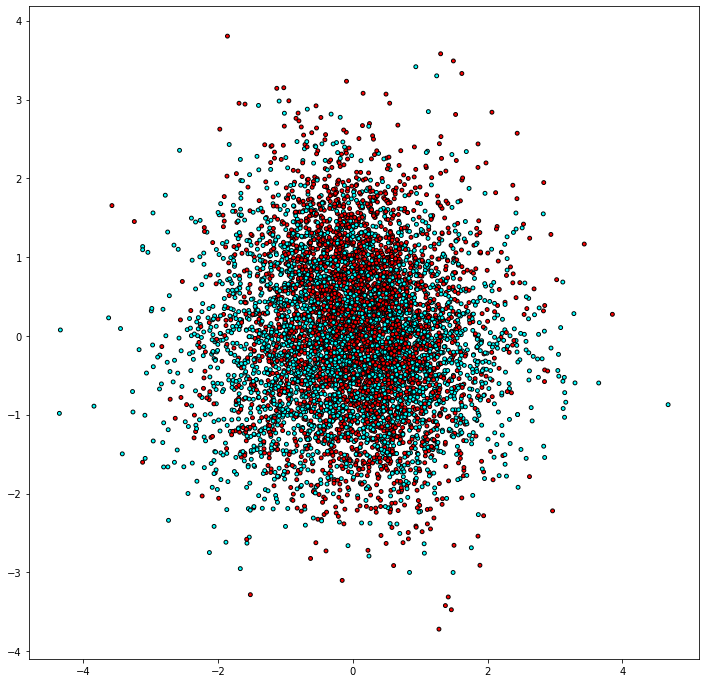

In [196]:
 # just plot the dataset first
plt.figure(figsize = (12, 12))
cm = plt.cm.RdBu
cm_bright = ListedColormap(['#FF0000', '#00FFFF'])
plt.scatter(train[10], train[14], c = y_train, cmap = cm_bright, edgecolors='k', s = 15);

# KNN

In [225]:

cls = KNeighborsClassifier(30)
scores = cross_validate(cls, X_train, y_train, cv = StratifiedShuffleSplit(4), scoring= "roc_auc",)["test_score"]
print(f"{np.mean(scores):.5f}+-{np.std(scores):.5f}")

0.82656+-0.01758


In [226]:
cls.fit(X_train, y_train)
roc_auc_score(y_validation, cls.predict_proba(X_validation)[:,1])

0.833565882539811

# Gaussian

In [181]:

cls = GaussianProcessClassifier(1.0 * RBF(1.0))
scores = cross_validate(cls, X_train, y_train, cv = StratifiedShuffleSplit(4), scoring= "roc_auc",)["test_score"]
print(f"{np.mean(scores):.5f}+-{np.std(scores):.5f}")

0.84616+-0.00825


In [183]:
cls.fit(X_train, y_train)
roc_auc_score(y_validation, cls.predict_proba(X_validation)[:,1])

0.7970588235294118

# Neural Net

In [198]:

cls = MLPClassifier(alpha=1, max_iter=1000)
scores = cross_validate(cls, X_train, y_train, cv = StratifiedShuffleSplit(4), scoring= "roc_auc",)["test_score"]
print(f"{np.mean(scores):.5f}+-{np.std(scores):.5f}")

0.83497+-0.01365


In [199]:
cls.fit(X_train, y_train)
roc_auc_score(y_validation, cls.predict_proba(X_validation)[:,1])

0.8383298537466203

# Summary

In [250]:
knn = KNeighborsClassifier(30)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=30)

In [251]:
nn = MLPClassifier(alpha=1, max_iter=1000)
nn.fit(X_train, y_train)

svc = SVC(kernel='rbf', degree=4, probability=True, class_weight='balanced', gamma='auto', C=1)
svc.fit(X_train, y_train)

gp = GaussianProcessClassifier(1.0 * RBF(1.0))
gp.fit(X_train, y_train)

GaussianProcessClassifier(kernel=1**2 * RBF(length_scale=1))

In [252]:
for cls in [nn, knn, svc, gp]:
    print(f'{str(cls)} {roc_auc_score(y_validation, cls.predict_proba(X_validation)[:,1]):.4f}')

MLPClassifier(alpha=1, max_iter=1000) 0.8383
KNeighborsClassifier(n_neighbors=30) 0.8336
SVC(C=1, class_weight='balanced', degree=4, gamma='auto', probability=True) 0.8380
GaussianProcessClassifier(kernel=1**2 * RBF(length_scale=1)) 0.8333


In [253]:
for cls in [nn, knn, svc, gp]:
    preds = cls.predict_proba(X_validation)[:,1]
    print(f'{str(cls)} {min(preds):.4f} {max(preds):.4f}')

MLPClassifier(alpha=1, max_iter=1000) 0.0132 0.9937
KNeighborsClassifier(n_neighbors=30) 0.0000 1.0000
SVC(C=1, class_weight='balanced', degree=4, gamma='auto', probability=True) 0.0165 0.9778
GaussianProcessClassifier(kernel=1**2 * RBF(length_scale=1)) 0.0239 0.9727


In [264]:
preds = [0]*len(X_validation)
for cls in [
    nn, 
    knn, 
    svc, 
#     gp
]:
    preds += cls.predict_proba(X_validation)[:, 1]
roc_auc_score(y_validation, preds)

0.8413824081370076

In [ ]:
0.8403362827632244

# test

## description

In [30]:
test_data = pd.read_csv("test.csv", header=None)[important_features]
test_data.head()

,10,2,8,14,13,29,7,12,5,0,28,21,6,19
0,-213.139157,-48.854416,192.961067,117.776726,-438.697273,-84.254441,-27.691507,167.220896,-90.504260,394.650101,-29.314711,140.952506,135.111157,439.386126
1,235.208582,235.644493,-122.290561,-150.823103,232.770741,-10.378203,-53.158605,30.691925,39.088440,62.200701,65.756136,-148.360929,-186.024836,-402.651882
2,189.115207,204.738165,-95.263085,130.937671,80.408480,-121.300353,-115.127927,-47.048687,33.604743,232.736729,126.144518,-234.606490,92.235943,-264.639656
3,-21.916455,62.694027,9.051856,-27.797463,44.407738,-58.425305,10.115134,11.176007,-58.616589,340.045437,109.378365,-56.332212,-55.080664,-56.165896
4,272.675402,489.203093,540.680255,-235.411444,577.827262,-87.902970,137.920737,-9.820108,44.666983,-60.576957,-8.162451,-6.645415,-161.487192,-369.641090


In [31]:
scaler = StandardScaler().fit(work_data[important_features])
train = scaler.transform(work_data[important_features])
test = scaler.transform(test_data[important_features])
y = work_data['target'].values

In [32]:
knn = KNeighborsClassifier(30)
nn = MLPClassifier(alpha=1, max_iter=1000)
svc = SVC(kernel='rbf', degree=4, probability=True, class_weight='balanced', gamma='auto', C=1)
gp = GaussianProcessClassifier(1.0 * RBF(1.0))

## KNN

In [33]:
cls = knn

scores = cross_validate(cls, train, y, cv = StratifiedShuffleSplit(4), scoring= "roc_auc",)["test_score"]
print(f"{np.mean(scores):.5f}+-{np.std(scores):.5f}")

cls.fit(train, y)

preds_proba = cls.predict_proba(test)[:,1]

pd.Series(preds_proba).to_csv("knn.csv", index =False, header = None)

pd.Series(preds_proba)[:10]

0.83232+-0.00702


0    0.100000
1    0.433333
2    0.133333
3    0.666667
4    0.166667
5    0.266667
6    0.433333
7    0.900000
8    0.433333
9    0.333333
dtype: float64

## NN

In [49]:
cls = MLPClassifier(alpha=1, max_iter=1000, hidden_layer_sizes = (200,150,100))

scores = cross_validate(cls, train, y, cv = StratifiedShuffleSplit(4), scoring= "roc_auc",)["test_score"]
print(f"{np.mean(scores):.5f}+-{np.std(scores):.5f}")

cls.fit(train, y)

preds_proba = cls.predict_proba(test)[:,1]

pd.Series(preds_proba).to_csv("nn.csv", index =False, header = None)

pd.Series(preds_proba)[:10]

0.84883+-0.01764


0    0.111536
1    0.211229
2    0.150199
3    0.376626
4    0.151506
5    0.152530
6    0.165946
7    0.873828
8    0.282393
9    0.165075
dtype: float64

## SVC

In [35]:
cls = svc

scores = cross_validate(cls, train, y, cv = StratifiedShuffleSplit(4), scoring= "roc_auc",)["test_score"]
print(f"{np.mean(scores):.5f}+-{np.std(scores):.5f}")

cls.fit(train, y)

preds_proba = cls.predict_proba(test)[:,1]

pd.Series(preds_proba).to_csv("svc.csv", index =False, header = None)

pd.Series(preds_proba)[:10]

0.83655+-0.00632


0    0.046824
1    0.448057
2    0.100383
3    0.439080
4    0.424942
5    0.132231
6    0.157839
7    0.904158
8    0.323577
9    0.185615
dtype: float64

## GP

In [36]:
cls = gp

scores = cross_validate(cls, train, y, cv = StratifiedShuffleSplit(4), scoring= "roc_auc",)["test_score"]
print(f"{np.mean(scores):.5f}+-{np.std(scores):.5f}")

cls.fit(train, y)

preds_proba = cls.predict_proba(test)[:,1]

pd.Series(preds_proba).to_csv("gp.csv", index =False, header = None)

pd.Series(preds_proba)[:10]

0.83959+-0.00534


0    0.049558
1    0.477520
2    0.108663
3    0.444517
4    0.397368
5    0.190045
6    0.233951
7    0.876116
8    0.450395
9    0.208382
dtype: float64

In [39]:
gp_preds=preds_proba
gp_preds[:10]

array([0.04955787, 0.47752008, 0.10866252, 0.44451736, 0.39736843,
       0.1900451 , 0.23395104, 0.87611608, 0.45039504, 0.20838235])

In [40]:
preds = [0]*len(test)
for cls in [
    nn, 
    knn, 
    svc, 
#     gp
]:
    preds += cls.predict_proba(test)[:, 1]
preds = preds +gp_preds

In [41]:
pd.Series(preds).to_csv("all.csv", index =False, header = None)

In [40]:
preds = [0]*len(test)
for cls in [
#     nn, 
    knn, 
    svc, 
#     gp
]:
    preds += cls.predict_proba(test)[:, 1]
preds = preds +gp_preds

pd.Series(preds).to_csv("knn_svc_gp.csv", index =False, header = None)

In [43]:
preds = [0]*len(test)
for cls in [
#     nn, 
#     knn, 
    svc, 
#     gp
]:
    preds += cls.predict_proba(test)[:, 1]
preds = preds +gp_preds

pd.Series(preds).to_csv("svc_gp.csv", index =False, header = None)

In [50]:
p = preds_proba + preds

In [51]:
pd.Series(p).to_csv("nn_svc_gp.csv", index =False, header = None)

In [ ]:
knn.fit(train, y)
svc.fit(train, y )
nn.fit(train, y )
gp.fit(train, y)